<a href="https://colab.research.google.com/github/Ziedny28/PCVK-Ganjil-2023/blob/main/proyek/Bounding_Box.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [43]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [44]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [45]:
import numpy as np
from google.colab.patches import cv2_imshow
import cv2

import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

In [46]:
image = cv2.imread('KTP_Wildan.jpg')

In [47]:
image.shape

(1600, 1200, 3)

# Clustering

In [48]:
def cluster_image(image):
  X = image.reshape(-1,3)
  kmeans = KMeans(n_clusters = 2, n_init=10)

  kmeans.fit(X)
  clustered_image = kmeans.cluster_centers_[kmeans.labels_]
  clustered_image = clustered_image.reshape(image.shape)

  return clustered_image

In [49]:
clustered_image = cluster_image(image)

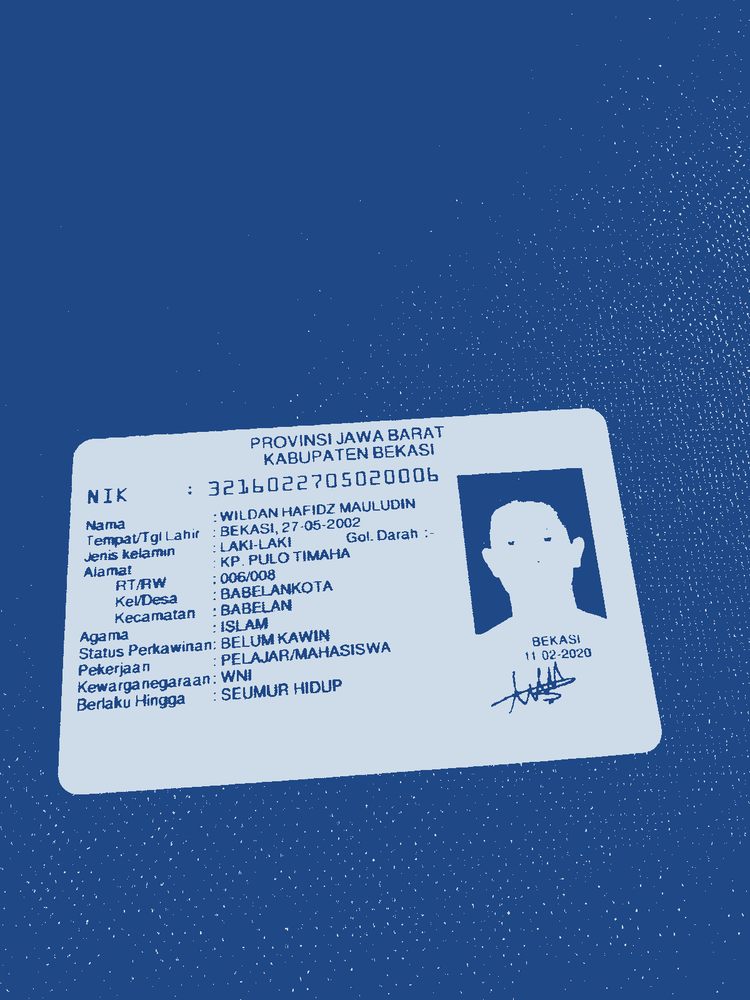

In [50]:
cv2_imshow(clustered_image)

In [51]:
clustered_image.shape

(1600, 1200, 3)

# Grayscale

In [52]:
clustered_image = clustered_image.astype(np.uint8)

# Option 1: Using OpenCV cvtColor
gray = cv2.cvtColor(clustered_image, cv2.COLOR_BGR2GRAY)

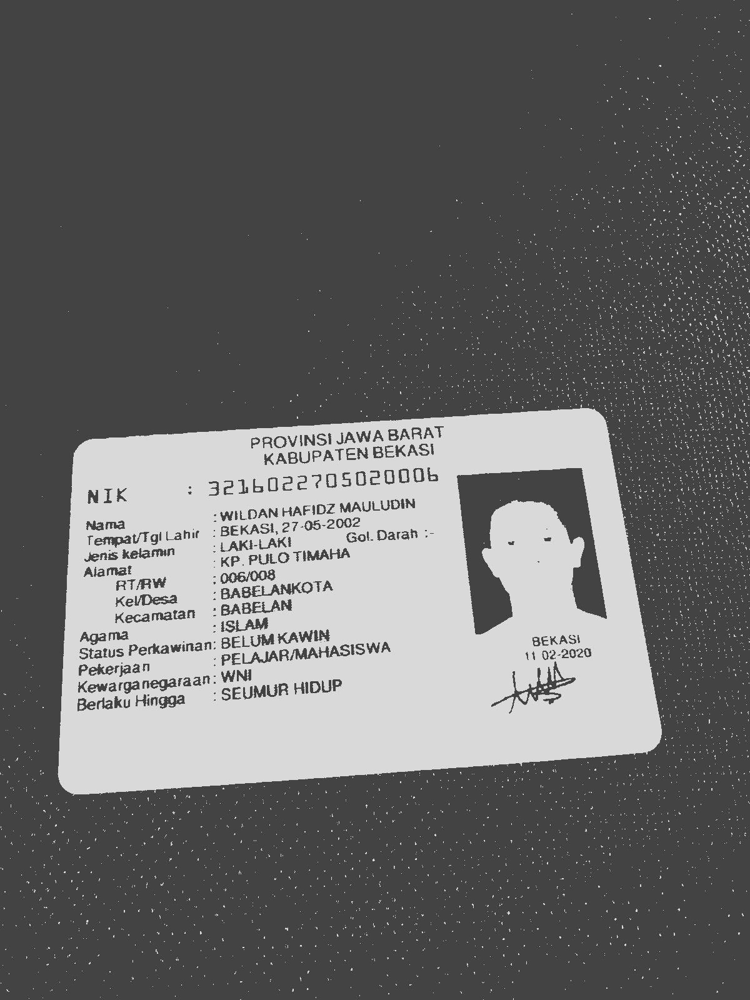

In [53]:
cv2_imshow(gray)

# Contour detection

In [54]:
def contour_detection(gray, image):
    # Apply thresholding to binarize the image
    thresh = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)[1]

    contours, hierarchy = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    image_copy_contours = image.copy()

    # Draw contours on the original image
    cv2.drawContours(image_copy_contours, contours, -1, (0, 255, 0), 2)

    return image_copy_contours, contours

In [55]:
image_copy_contours, contours = contour_detection(gray, image)

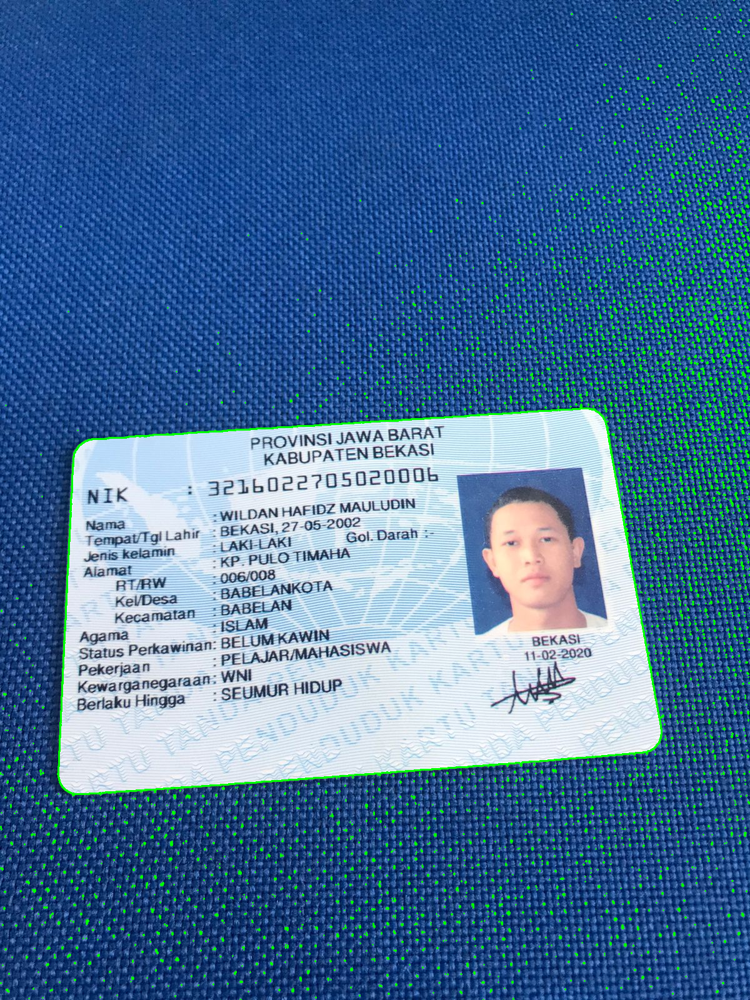

In [56]:
cv2_imshow(image_copy_contours)

# Mencari Contour terbesar

In [57]:
def find_largest_contour(contours,image):
    largest_area = 0
    largest_contour_index = -1

    for i, contour in enumerate(contours):
        area = cv2.contourArea(contour)
        if area > largest_area:
            largest_area = area
            largest_contour_index = i
            print(f"largest_contour_index:{largest_contour_index}")

    largest_contour = contours[largest_contour_index]

    cv2.drawContours(image, [largest_contour], -1, (0, 255, 0), 2)

    return largest_contour, image

largest_contour_index:11
largest_contour_index:16
largest_contour_index:24
largest_contour_index:276
largest_contour_index:302
largest_contour_index:402
largest_contour_index:2684


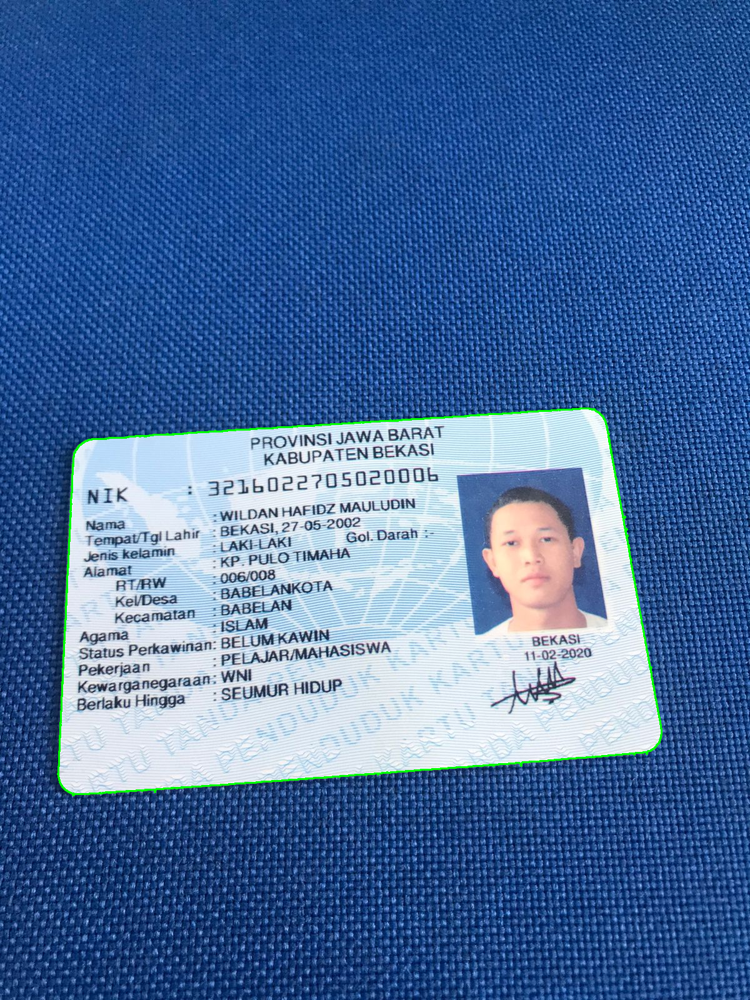

In [58]:
largest_contour, image =  find_largest_contour(contours,image)

cv2_imshow(image)

In [59]:
def make_outside_black(original_image, largest_contour):
    # Create a mask of the largest contour
    mask = np.zeros_like(original_image)
    cv2.drawContours(mask, [largest_contour], -1, (255, 255, 255), thickness=cv2.FILLED)

    # Make the outside of the contour black
    result_image = np.where(mask != 0, original_image, 0)

    return result_image


In [60]:
black_outside = make_outside_black(image,largest_contour)

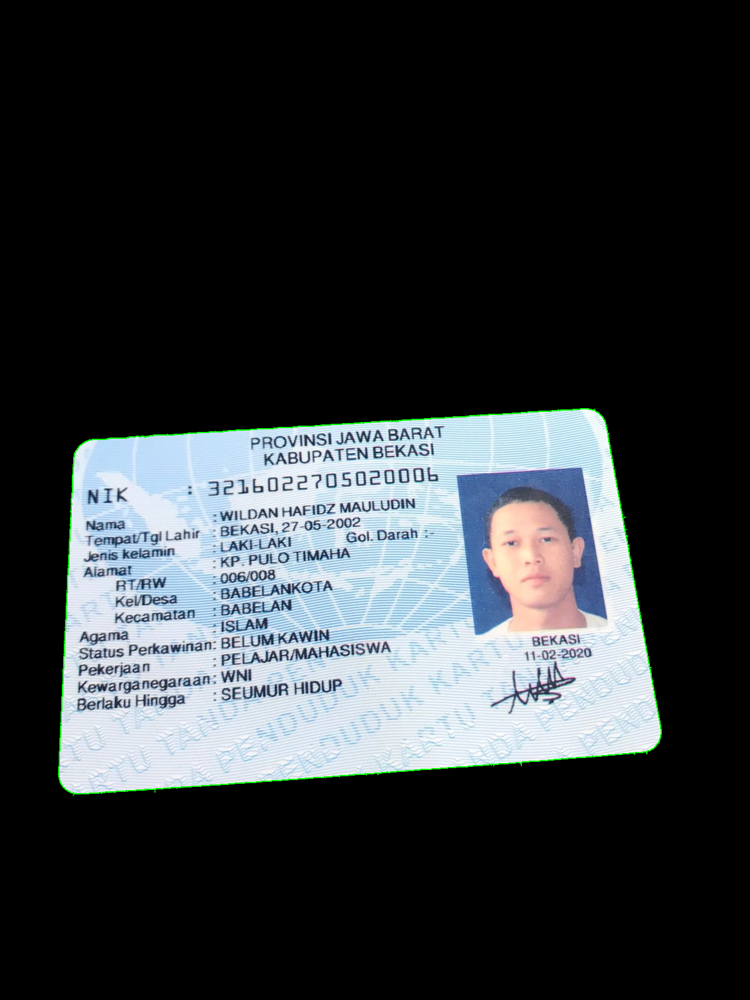

In [61]:
cv2_imshow(black_outside)

# Straightened

In [62]:
def do_perspective_transformation(rgb, input_array):
    height, width = rgb.shape[:2]
    input_array = np.float32(input_array)
    output_array = np.float32([(0,0), (width, 0), (width, height), (0, height)])
    matrix = cv2.getPerspectiveTransform(input_array, output_array)
    result = cv2.warpPerspective(rgb, matrix, (width, height), cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT, borderValue=(0,0,0))
    return result


def get_transformed_image(black_outside,contours):
    gray = cv2.cvtColor(black_outside, cv2.COLOR_RGB2GRAY)
    blur = cv2.medianBlur(gray, 1)
    _, thresh = cv2.threshold(blur, 0 , 255, cv2.THRESH_OTSU)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    for cnt in contours:
        approx = cv2.approxPolyDP(cnt, 0.01*cv2.arcLength(cnt, True), True)
        area = cv2.contourArea(cnt)
        if len(approx) == 4 and area > 100:
            print('approx', approx)
            points = approx.ravel().reshape(-1, 2)
            print('points', points)
            # Sort points based on x and y coordinates
            sorted_list = sorted(points, key=lambda x: (x[0], x[1]))
            c1, c2, c3, c4 = sorted_list
            cv2.circle(black_outside, tuple(c1), 5, 255, -1)
            cv2.circle(black_outside, tuple(c2), 5, 255, -1)
            cv2.circle(black_outside, tuple(c3), 5, 255, -1)
            cv2.circle(black_outside, tuple(c4), 5, 255, -1)
            input_array = [tuple(c2), tuple(c1), tuple(c4), tuple(c3)]
            crop = do_perspective_transformation(black_outside, input_array)

    # jika transformed_image memiliki skala 1.333 artinya gambarnya miring dan terbalik
    h,w,_ = crop.shape
    scale = h/w


    if scale > 1.2 and scale < 1.4:
        # Rotate the image 90 degrees clockwise
        rotated_image = cv2.rotate(crop, cv2.ROTATE_90_CLOCKWISE)

        # Mirror the image horizontally
        mirrored_image = cv2.flip(rotated_image, 1)
        crop = mirrored_image

    return crop


approx [[[ 965  667]]

 [[ 132  708]]

 [[  99 1258]]

 [[1035 1206]]]
points [[ 965  667]
 [ 132  708]
 [  99 1258]
 [1035 1206]]


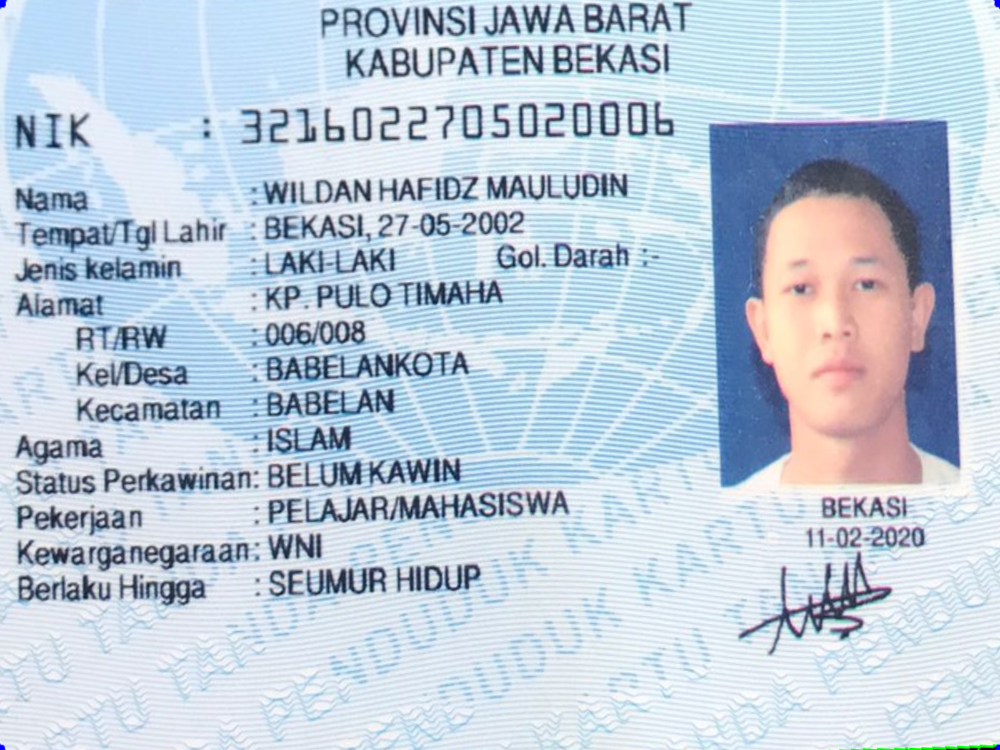

In [63]:
ktp_width, ktp_height = 856, 540

crop = get_transformed_image(black_outside,contours)

cv2_imshow(crop)

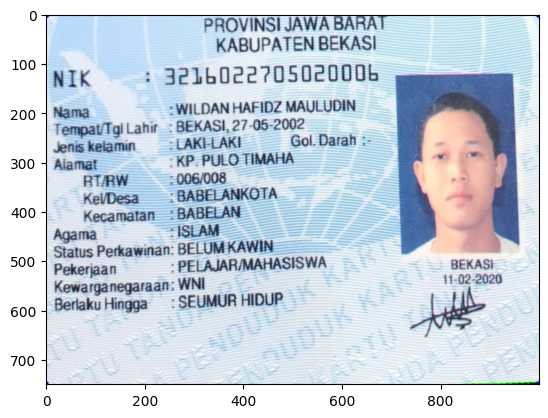

In [64]:
crop = cv2.cvtColor(crop, cv2.COLOR_BGR2RGB)

h, w, c = crop.shape

if w > 1000:

    new_w = 1000
    ar = w/h
    new_h = int(new_w/ar)

    crop = cv2.resize(crop, (new_w, new_h), interpolation = cv2.INTER_AREA)

plt.imshow(crop);

In [65]:
def get_inverted_image(gray):

    # Fungsi thresholding biner
    _, binary_thresh_img = cv2.threshold(gray, 128, 255, cv2.THRESH_BINARY)

    # Fungsi inversi warna
    return cv2.bitwise_not(binary_thresh_img)

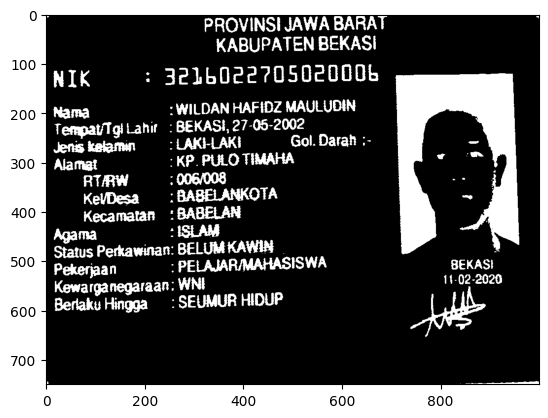

In [66]:
clustered_image = cluster_image(crop)
clustered_image = clustered_image.astype(np.uint8)

gray = cv2.cvtColor(clustered_image, cv2.COLOR_BGR2GRAY)

# Fungsi inversi warna
inverted_img = get_inverted_image(gray)

plt.imshow(inverted_img, cmap='gray');

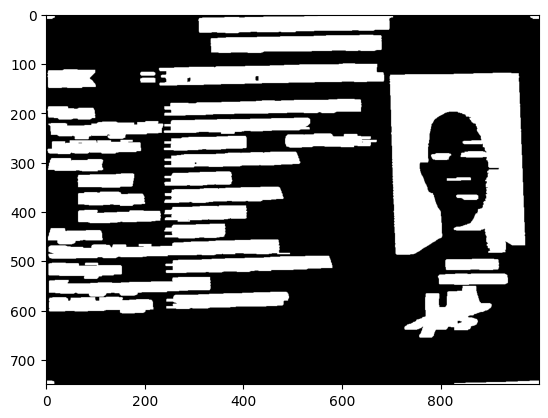

In [67]:
#dilation
kernel = np.ones((3,25), np.uint8)
dilated = cv2.dilate(inverted_img, kernel, iterations = 1)
plt.imshow(dilated, cmap='gray');

In [68]:
(contours, heirarchy) = cv2.findContours(dilated.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
sorted_contours_lines = sorted(contours, key = lambda ctr : cv2.boundingRect(ctr)[1]) # (x, y, w, h)

In [69]:
def get_sorted_contours_lines(sorted_contours_lines, crop):
    img2 = crop.copy()

    for ctr in sorted_contours_lines:
        x,y,w,h = cv2.boundingRect(ctr)
        if (w >= 10 and w <= 1000) and (h >= 20 and h <= 50):
            cv2.rectangle(img2, (x, y), (x + w, y + h), (40, 100, 250), 2)

    return img2


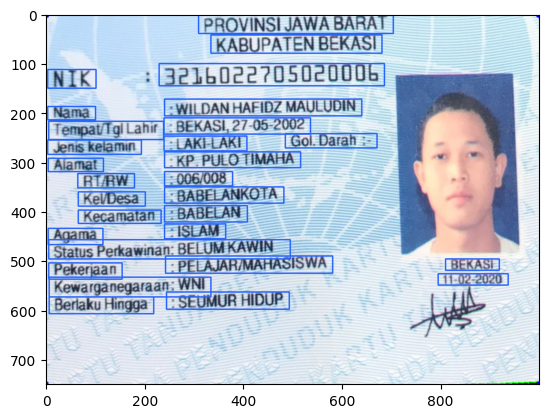

In [70]:
img2 = get_sorted_contours_lines(sorted_contours_lines, crop)

plt.imshow(img2);

In [71]:
def save_contoured_area(sorted_contours_lines):
    # List untuk menyimpan hasil crop
    crop_results = []


    for ctr in sorted_contours_lines:
        x, y, w, h = cv2.boundingRect(ctr)

        # Periksa ukuran bounding box
        if (w >= 10 and w <= 1000) and (h >= 20 and h <= 50):
            # Crop bagian gambar yang ada di dalam bounding box
            cropped_img = crop[y:y+h, x:x+w]

            # Tambahkan hasil crop ke dalam list
            crop_results.append(cropped_img)

    return crop_results

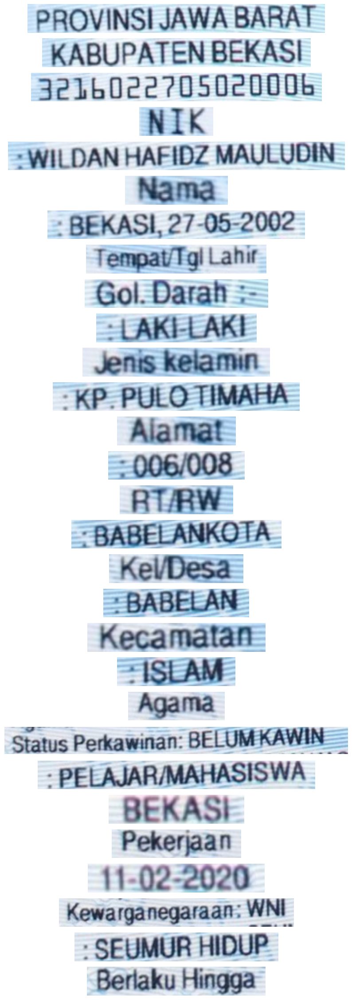

In [72]:
# List untuk menyimpan hasil crop
crop_results = save_contoured_area(sorted_contours_lines)

# Membuat figure dengan ukuran yang sesuai
plt.figure(figsize=(10, len(crop_results)))

# Loop untuk menampilkan setiap hasil crop satu per satu
for idx, result in enumerate(crop_results, 1):
    plt.subplot(len(crop_results), 1, idx)
    plt.imshow(result)
    plt.axis('off')


# Menampilkan hasil crop
plt.show()

In [73]:
# Fungsi untuk resize gambar
def resize_img(image, width, height):
    return cv2.resize(image, (width, height))

# Fungsi untuk normalisasi gambar (jika diperlukan)
def normalization(image):
    # Implementasi normalisasi gambar di sini (jika diperlukan)
    pass

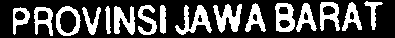

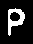

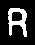

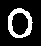

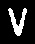

...

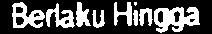

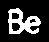

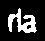

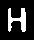

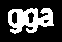

In [74]:
from PIL import Image, ImageOps
from google.colab.patches import cv2_imshow

def crop_and_process(contour, crop_results):
    x, y, w, h = cv2.boundingRect(contour)

    if (10 <= w <= 1000) and (20 <= h <= 50):
        cropped_img = crop[y:y+h, x:x+w]
        gray_img = cv2.cvtColor(cropped_img, cv2.COLOR_BGR2GRAY)
        _, otsu = cv2.threshold(gray_img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
        invertion = 255 - otsu
        crop_results.append(invertion)
        cv2_imshow(invertion)
        segment_letters(invertion)

def segment_letters(image):
    contours_letter, _ = cv2.findContours(image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contours_letter = sorted(contours_letter, key=lambda x: cv2.boundingRect(x)[0])

    for contour in contours_letter:
        x1, y1, w1, h1 = cv2.boundingRect(contour)
        if cv2.contourArea(contour) > 6 and w1/h1 < 2:
            letter = image[y1:y1+h1, x1:x1+w1]
            process_segmented_letter(letter)

def process_segmented_letter(letter):
    pil_img = Image.fromarray(letter)
    padding_size = 8
    padded_letter = ImageOps.expand(pil_img, border=padding_size, fill=(0,))
    numpy_letter = np.array(padded_letter)
    cv2_imshow(numpy_letter)

# Main loop
crop_results = []

for ctr in sorted_contours_lines:
    crop_and_process(ctr, crop_results)


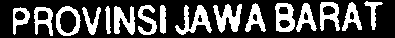

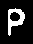

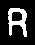

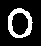

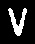

...

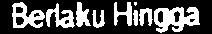

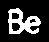

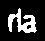

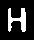

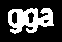

In [33]:
from PIL import Image, ImageOps
from google.colab.patches import cv2_imshow

# List untuk menyimpan hasil crop
crop_results = []

# Loop untuk menampilkan setiap hasil crop satu per satu
for ctr in sorted_contours_lines:
    x, y, w, h = cv2.boundingRect(ctr)

    # Periksa ukuran bounding box
    if (w >= 10 and w <= 1000) and (h >= 20 and h <= 50):
        # Crop bagian gambar yang ada di dalam bounding box
        cropped_img = crop[y:y+h, x:x+w]

        # Konversi ke citra greyscale
        gray_img = cv2.cvtColor(cropped_img, cv2.COLOR_BGR2GRAY)

        # Thresholding dengan Otsu
        _, otsu = cv2.threshold(gray_img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

        # Invertion
        invertion = 255 - otsu

        # Tambahkan hasil crop yang telah diproses ke dalam list
        crop_results.append(invertion)

        # Display crop_results
        cv2_imshow(invertion)

        # Segmentation of letters
        contours_letter, _ = cv2.findContours(invertion, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        contours_letter = sorted(contours_letter, key=lambda x: cv2.boundingRect(x)[0])

        # Segmentasi huruf berdasarkan bounding box dari tiap kontur
        for contour in contours_letter:
            x1, y1, w1, h1 = cv2.boundingRect(contour)

            # Tambahkan huruf ke list jika memenuhi kriteria tertentu (misal: min/max luas)
            if cv2.contourArea(contour) > 6 and w1/h1 < 2:
                letter = invertion[y1:y1+h1, x1:x1+w1]

                # Convert the image to PIL format
                pil_img = Image.fromarray(letter)

                # Tentukan ukuran padding (misalnya, 5 piksel)
                padding_size = 8

                # Buat border padding menggunakan ImageOps.expand
                padded_letter = ImageOps.expand(pil_img, border=padding_size, fill=(0,))

                # Konversi citra PIL ke array NumPy
                numpy_letter = np.array(padded_letter)

                # Display the segmented letter
                cv2_imshow(numpy_letter)

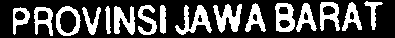

Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 153ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 18ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 18ms/step
Hasil prediksi: [


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 21ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 18ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 18ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 18ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 17ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 21ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 25ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 19ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 21ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 20ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 21ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 16ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 20ms/step
Hasil prediksi: a


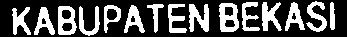

Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 18ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 18ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 18ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 19ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 21ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 22ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 23ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 20ms/step
Hasil prediksi: 


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 24ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 19ms/step
Hasil prediksi: 


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 29ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 25ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 29ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 22ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 19ms/step
Hasil prediksi: 


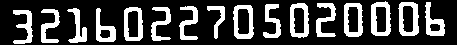

Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 18ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 20ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 20ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 21ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 21ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 20ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 21ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 19ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 17ms/step
Hasil prediksi: [


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 19ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 19ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 19ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 20ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 18ms/step
Hasil prediksi: [


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 17ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 20ms/step
Hasil prediksi: a


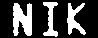

Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 19ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 17ms/step
Hasil prediksi: [


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 19ms/step
Hasil prediksi: a


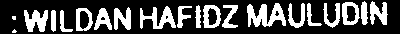

Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 22ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 21ms/step
Hasil prediksi: G


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 19ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 18ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 18ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 21ms/step
Hasil prediksi: [


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 21ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 21ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 20ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 18ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 20ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 20ms/step
Hasil prediksi: [


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 21ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 21ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 20ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 21ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 21ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 20ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 21ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 18ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 21ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 21ms/step
Hasil prediksi: a


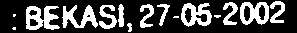

Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 18ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 18ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 19ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 17ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 20ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 21ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 21ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 21ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 24ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 19ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 21ms/step
Hasil prediksi: a


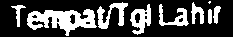

Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 18ms/step
Hasil prediksi: [


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 19ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 28ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 19ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 18ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 18ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 19ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 26ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 27ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 29ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 32ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 27ms/step
Hasil prediksi: [


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 25ms/step
Hasil prediksi: 


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 33ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 28ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 25ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 26ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 38ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 36ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 37ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 34ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 33ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 29ms/step
Hasil prediksi: |


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 35ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 29ms/step
Hasil prediksi: g


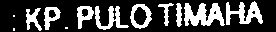

Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 30ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 33ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 34ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 34ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 33ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 31ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 29ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 25ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 36ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 29ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 29ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 26ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 28ms/step
Hasil prediksi: [


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 27ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 29ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 34ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 34ms/step
Hasil prediksi: g


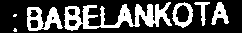

Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 30ms/step
Hasil prediksi: 


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 31ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 28ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 28ms/step
Hasil prediksi: I


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 35ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 29ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 24ms/step
Hasil prediksi: a


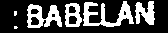

Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 26ms/step
Hasil prediksi: 


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 25ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 27ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 25ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 27ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 32ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 34ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 30ms/step
Hasil prediksi: |


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 26ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 31ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 18ms/step
Hasil prediksi: a


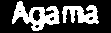

Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 21ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 18ms/step
Hasil prediksi: g


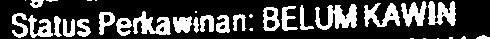

Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 18ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 19ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 28ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 17ms/step
Hasil prediksi: [


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 22ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 22ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 21ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 19ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 18ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 18ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 20ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 21ms/step
Hasil prediksi: [


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 18ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 19ms/step
Hasil prediksi: [


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 21ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 23ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 18ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 20ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 19ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 19ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 20ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 18ms/step
Hasil prediksi: g


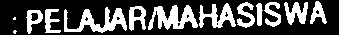

Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 21ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 18ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 19ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 17ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 18ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 17ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 27ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 20ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 18ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 19ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 21ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 17ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 18ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 19ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 19ms/step
Hasil prediksi: a


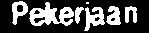

Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 27ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 19ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 18ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 21ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 26ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 19ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 19ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 19ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 19ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 19ms/step
Hasil prediksi: g


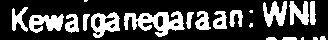

Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 18ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 19ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 18ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 17ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 19ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 19ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 17ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 19ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 19ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 21ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 18ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 19ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 18ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 18ms/step
Hasil prediksi: 


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 17ms/step
Hasil prediksi: g


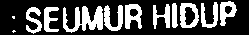

Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 18ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 17ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 17ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 20ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 18ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 20ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 19ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 18ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 17ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 19ms/step
Hasil prediksi: a


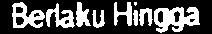

Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 19ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 22ms/step
Hasil prediksi: a


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 18ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 17ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 17ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 24ms/step
Hasil prediksi: g


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 19ms/step
Hasil prediksi: [


Shape of numpy_letter_resized_expanded_batched: (1, 28, 28, 1)
1/1 [==============================] - 0s 27ms/step
Hasil prediksi: a


In [75]:
from PIL import Image, ImageOps
from google.colab.patches import cv2_imshow
from tensorflow.keras.models import load_model

# Load model
network = load_model('ocr_model.keras')

# List untuk menyimpan hasil crop
crop_results = []

# Loop untuk menampilkan setiap hasil crop satu per satu
for ctr in sorted_contours_lines:
    x, y, w, h = cv2.boundingRect(ctr)

    # Periksa ukuran bounding box
    if (w >= 10 and w <= 1000) and (h >= 20 and h <= 50):
        # Crop bagian gambar yang ada di dalam bounding box
        cropped_img = crop[y:y+h, x:x+w]

        # Konversi ke citra greyscale
        gray_img = cv2.cvtColor(cropped_img, cv2.COLOR_BGR2GRAY)

        # Thresholding dengan Otsu
        _, otsu = cv2.threshold(gray_img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

        # Invertion
        invertion = 255 - otsu

        # Tambahkan hasil crop yang telah diproses ke dalam list
        crop_results.append(invertion)

        # Display crop_results
        cv2_imshow(invertion)

        # Segmentation of letters
        contours_letter, _ = cv2.findContours(invertion, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        contours_letter = sorted(contours_letter, key=lambda x: cv2.boundingRect(x)[0])

        # Segmentasi huruf berdasarkan bounding box dari tiap kontur
        for contour in contours_letter:
            x1, y1, w1, h1 = cv2.boundingRect(contour)

            # Tambahkan huruf ke list jika memenuhi kriteria tertentu (misal: min/max luas)
            if cv2.contourArea(contour) > 6 and w1/h1 < 2:
                letter = otsu[y1:y1+h1, x1:x1+w1]

                # Resize gambar huruf agar sesuai dengan bentuk input model
                letter = cv2.resize(letter, (28, 28), interpolation=cv2.INTER_AREA)

                # Convert the image to PIL format
                pil_img = Image.fromarray(letter)

                # # Tentukan ukuran padding (misalnya, 5 piksel)
                # padding_size = 3

                # # Buat border padding menggunakan ImageOps.expand
                # padded_letter = ImageOps.expand(pil_img, border=padding_size, fill=(0,))

                # Konversi citra PIL ke array NumPy
                numpy_letter = np.array(pil_img)

                # Display the resized and padded segmented letter
                cv2_imshow(numpy_letter)

                # Konversi citra PIL ke array NumPy
                numpy_letter_resized = np.array(pil_img)

                # Menambahkan dimensi baru pada axis terakhir
                numpy_letter_resized_expanded = np.expand_dims(numpy_letter_resized, axis=-1)

                # Menambahkan dimensi batch (None) pada axis pertama
                numpy_letter_resized_expanded_batched = np.expand_dims(numpy_letter_resized_expanded, axis=0)

                # Cetak bentuk numpy_letter_resized_expanded_batched
                print(f"Shape of numpy_letter_resized_expanded_batched: {numpy_letter_resized_expanded_batched.shape}")

                # Lakukan prediksi menggunakan model
                if network is not None:
                    prediction = network.predict(numpy_letter_resized_expanded_batched)
                    char_detected = chr(ord('A') + np.argmax(prediction))  # Misalnya, anggap model output sebagai one-hot encoding

                    # Menambahkan teks hasil prediksi pada gambar
                    cv2.putText(numpy_letter_resized, char_detected, (x1 - 10, y1 - 10), cv2.FONT_HERSHEY_COMPLEX, 1, (0, 0, 255), 2)
                    # Cetak hasil prediksi
                    print(f"Hasil prediksi: {char_detected}")

#Pytesseract

In [76]:
!sudo apt install tesseract-ocr
!pip install pytesseract
!sudo apt-get install tesseract-ocr-ind

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
tesseract-ocr is already the newest version (4.1.1-2.1build1).
0 upgraded, 0 newly installed, 0 to remove and 24 not upgraded.
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
tesseract-ocr-ind is already the newest version (1:4.00~git30-7274cfa-1.1).
0 upgraded, 0 newly installed, 0 to remove and 24 not upgraded.


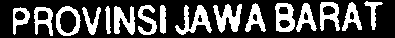

Predicted text for letter: P



Predicted text for letter: =



Predicted text for letter: O



Predicted text for letter: i]



Predicted text for letter: |



Predicted text for letter: N



Predicted text for letter: S



Predicted text for letter: 


Predicted text for letter: JA



Predicted text for letter: Ww



Predicted text for letter: A



Predicted text for letter: B



Predicted text for letter: A



Predicted text for letter: R



Predicted text for letter: ry



Predicted text for letter: T



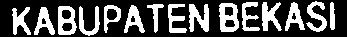

Predicted text for letter: 4



Predicted text for letter: .



Predicted text for letter: B



Predicted text for letter: U



Predicted text for letter: P



Predicted text for letter: A



Predicted text for letter: a



Predicted text for letter: =



Predicted text for letter: i]



Predicted text for letter: B



Predicted text for letter: =



Predicted text for letter: 1



Predicted text for letter: A



Predicted text for letter: Ss



Predicted text for letter: |



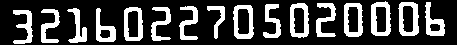

Predicted text for letter: ce]



Predicted text for letter: 2



Predicted text for letter: 1



Predicted text for letter: b



Predicted text for letter: 0



Predicted text for letter: 2



Predicted text for letter: 2



Predicted text for letter: ri



Predicted text for letter: ia



Predicted text for letter: i)



Predicted text for letter: 0



Predicted text for letter: e



Predicted text for letter: 1



Predicted text for letter: 0



Predicted text for letter: 0



Predicted text for letter: 5



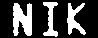

Predicted text for letter: |



Predicted text for letter: a



Predicted text for letter: 14



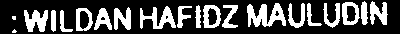

Predicted text for letter: a



Predicted text for letter: .



Predicted text for letter: Ww



Predicted text for letter: 


Predicted text for letter: a



Predicted text for letter: D



Predicted text for letter: ry



Predicted text for letter: i]



Predicted text for letter: chy



Predicted text for letter: F



Predicted text for letter: i



Predicted text for letter: 9}



Predicted text for letter: Zz



Predicted text for letter: MA



Predicted text for letter: vy



Predicted text for letter: a



Predicted text for letter: U



Predicted text for letter: is}



Predicted text for letter: i}



Predicted text for letter: N



Predicted text for letter: ey



Predicted text for letter: ma



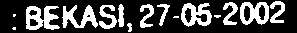

Predicted text for letter: i



Predicted text for letter: Ly



Predicted text for letter: Ss



Predicted text for letter: i



Predicted text for letter: 3



Predicted text for letter: i



Predicted text for letter: vi



Predicted text for letter: 05



Predicted text for letter: Ya



Predicted text for letter: 00



Predicted text for letter: 2



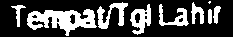

Predicted text for letter: T



Predicted text for letter: wt



Predicted text for letter: Ci



Predicted text for letter: F



Predicted text for letter: h



Predicted text for letter: 


Predicted text for letter: f



Predicted text for letter: G



Predicted text for letter: ce)



Predicted text for letter: 


Predicted text for letter: .



Predicted text for letter: D



Predicted text for letter: a



Predicted text for letter: t



Predicted text for letter: 3



Predicted text for letter: Ly



Predicted text for letter: '



Predicted text for letter: vy



Predicted text for letter: K



Predicted text for letter: i



Predicted text for letter: i,



Predicted text for letter: L



Predicted text for letter: i



Predicted text for letter: e



Predicted text for letter: ns



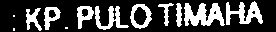

Predicted text for letter: hq



Predicted text for letter: P



Predicted text for letter: p



Predicted text for letter: vs



Predicted text for letter: O



Predicted text for letter: a7



Predicted text for letter: 


Predicted text for letter: ry



Predicted text for letter: hy



Predicted text for letter: ry



Predicted text for letter: a



Predicted text for letter: fut



Predicted text for letter: i



Predicted text for letter: ot



Predicted text for letter: ad



Predicted text for letter: iat



Predicted text for letter: Yo



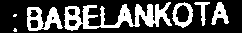

Predicted text for letter: .



Predicted text for letter: |



Predicted text for letter: [9]



Predicted text for letter: ae



Predicted text for letter: A



Predicted text for letter: K



Predicted text for letter: e



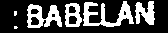

Predicted text for letter: o



Predicted text for letter: yy



Predicted text for letter: B



Predicted text for letter: ci0y



Predicted text for letter: I



Predicted text for letter: Eq



Predicted text for letter: a



Predicted text for letter: iF



Predicted text for letter: Es)



Predicted text for letter: I



Predicted text for letter: iS



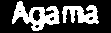

Predicted text for letter: ga



Predicted text for letter: a



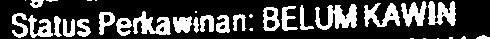

Predicted text for letter: Ss



Predicted text for letter: Ley



Predicted text for letter: 2



Predicted text for letter: i



Predicted text for letter: iT]



Predicted text for letter: Ey



Predicted text for letter: Pp



Predicted text for letter: e



Predicted text for letter: F



Predicted text for letter: w



Predicted text for letter: 4



Predicted text for letter: fn



Predicted text for letter: cI



Predicted text for letter: Fal



Predicted text for letter: 


Predicted text for letter: B



Predicted text for letter: ia



Predicted text for letter: a



Predicted text for letter: uty



Predicted text for letter: fy



Predicted text for letter: Yi



Predicted text for letter: 1



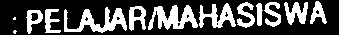

Predicted text for letter: P



Predicted text for letter: 3



Predicted text for letter: R



Predicted text for letter: HA



Predicted text for letter: ES



Predicted text for letter: i}



Predicted text for letter: Ss



Predicted text for letter: A



Predicted text for letter: A



Predicted text for letter: 8



Predicted text for letter: 3



Predicted text for letter: K



Predicted text for letter: ry



Predicted text for letter: s



Predicted text for letter: 


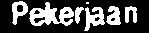

Predicted text for letter: .



Predicted text for letter: roc



Predicted text for letter: ¢



Predicted text for letter: a



Predicted text for letter: a



Predicted text for letter: iy



Predicted text for letter: i



Predicted text for letter: 1



Predicted text for letter: -



Predicted text for letter: 02



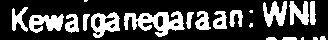

Predicted text for letter: K



Predicted text for letter: e



Predicted text for letter: 2



Predicted text for letter: Lf



Predicted text for letter: ee



Predicted text for letter: f



Predicted text for letter: a



Predicted text for letter: a



Predicted text for letter: f



Predicted text for letter: a



Predicted text for letter: i]



Predicted text for letter: N



Predicted text for letter: |



Predicted text for letter: a



Predicted text for letter: eS



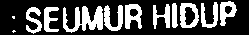

Predicted text for letter: s



Predicted text for letter: E



Predicted text for letter: UM



Predicted text for letter: u



Predicted text for letter: R



Predicted text for letter: H



Predicted text for letter: !



Predicted text for letter: D



Predicted text for letter: u



Predicted text for letter: p



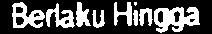

Predicted text for letter: iy



Predicted text for letter: da



Predicted text for letter: i



Predicted text for letter: U



Predicted text for letter: H



Predicted text for letter: 1



Predicted text for letter: ti)



Predicted text for letter: cer



In [78]:
from PIL import Image, ImageOps
from google.colab.patches import cv2_imshow
import pytesseract as pts
import numpy as np

# List to store crop results
crop_results = []

# List to store detected words
detected_words = []

def process_bounding_box(ctr):
    x, y, w, h = cv2.boundingRect(ctr)

    if (10 <= w <= 1000) and (20 <= h <= 50):
        cropped_img = crop[y:y+h, x:x+w]
        gray_img = cv2.cvtColor(cropped_img, cv2.COLOR_BGR2GRAY)
        _, otsu = cv2.threshold(gray_img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
        invertion = 255 - otsu
        crop_results.append(invertion)
        cv2_imshow(invertion)
        segment_and_process_letters(invertion)

def segment_and_process_letters(invertion):
    contours_letter, _ = cv2.findContours(invertion, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contours_letter = sorted(contours_letter, key=lambda x: cv2.boundingRect(x)[0])

    predicted_chars_crop = []
    for contour in contours_letter:
        x1, y1, w1, h1 = cv2.boundingRect(contour)

        if cv2.contourArea(contour) > 6 and w1/h1 < 2:
            letter = invertion[y1:y1+h1, x1:x1+w1]
            process_segmented_letter(letter, predicted_chars_crop)

def process_segmented_letter(letter, predicted_chars_crop):
    pil_img = Image.fromarray(letter)
    padding_size = 10
    padded_letter = ImageOps.expand(pil_img, border=padding_size, fill=(0,))
    numpy_letter = np.array(padded_letter)
    numpy_letter_resized = resize_and_display_letter(numpy_letter)
    recognize_and_print_char(numpy_letter_resized, predicted_chars_crop)

def resize_and_display_letter(letter):
    desired_width = 30
    current_width = letter.shape[1]
    scale_factor = desired_width / current_width
    letter_resized = cv2.resize(letter, (desired_width, int(letter.shape[0] * scale_factor)))
    cv2_imshow(letter_resized)
    return letter_resized

def recognize_and_print_char(letter, predicted_chars_crop):
    predicted_char = pts.image_to_string(letter, config='--psm 10')
    print(f"Predicted text for letter: {predicted_char}")
    predicted_chars_crop.append(predicted_char)

# Main loop
detected_words = []

for ctr in sorted_contours_lines:
    process_bounding_box(ctr)

# Display detected words
for i, detected_word in enumerate(detected_words):
    print(f"Detected Word for Crop {i + 1}: {detected_word}")


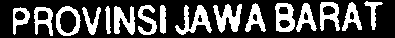

Predicted text for letter: P



Predicted text for letter: =



Predicted text for letter: O



Predicted text for letter: i]



Predicted text for letter: |



Predicted text for letter: N



Predicted text for letter: S



Predicted text for letter: 


Predicted text for letter: JA



Predicted text for letter: Ww



Predicted text for letter: A



Predicted text for letter: B



Predicted text for letter: A



Predicted text for letter: R



Predicted text for letter: ry



Predicted text for letter: T



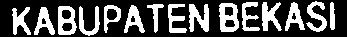

Predicted text for letter: 4



Predicted text for letter: .



Predicted text for letter: B



Predicted text for letter: U



Predicted text for letter: P



Predicted text for letter: A



Predicted text for letter: a



Predicted text for letter: =



Predicted text for letter: i]



Predicted text for letter: B



Predicted text for letter: =



Predicted text for letter: 1



Predicted text for letter: A



Predicted text for letter: Ss



Predicted text for letter: |



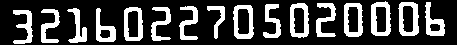

Predicted text for letter: ce]



Predicted text for letter: 2



Predicted text for letter: 1



Predicted text for letter: b



Predicted text for letter: 0



Predicted text for letter: 2



Predicted text for letter: 2



Predicted text for letter: ri



Predicted text for letter: ia



Predicted text for letter: i)



Predicted text for letter: 0



Predicted text for letter: e



Predicted text for letter: 1



Predicted text for letter: 0



Predicted text for letter: 0



Predicted text for letter: 5



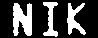

Predicted text for letter: |



Predicted text for letter: a



Predicted text for letter: 14



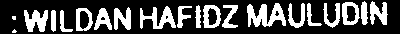

Predicted text for letter: a



Predicted text for letter: .



Predicted text for letter: Ww



Predicted text for letter: 


Predicted text for letter: a



Predicted text for letter: D



Predicted text for letter: ry



Predicted text for letter: i]



Predicted text for letter: chy



Predicted text for letter: F



Predicted text for letter: i



Predicted text for letter: 9}



Predicted text for letter: Zz



Predicted text for letter: MA



Predicted text for letter: vy



Predicted text for letter: a



Predicted text for letter: U



Predicted text for letter: is}



Predicted text for letter: i}



Predicted text for letter: N



Predicted text for letter: ey



Predicted text for letter: ma



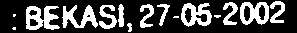

Predicted text for letter: i



Predicted text for letter: Ly



Predicted text for letter: Ss



Predicted text for letter: i



Predicted text for letter: 3



Predicted text for letter: i



Predicted text for letter: vi



Predicted text for letter: 05



Predicted text for letter: Ya



Predicted text for letter: 00



Predicted text for letter: 2



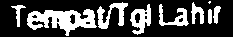

Predicted text for letter: T



Predicted text for letter: wt



Predicted text for letter: Ci



Predicted text for letter: F



Predicted text for letter: h



Predicted text for letter: 


Predicted text for letter: f



Predicted text for letter: G



Predicted text for letter: ce)



Predicted text for letter: 


Predicted text for letter: .



Predicted text for letter: D



Predicted text for letter: a



Predicted text for letter: t



Predicted text for letter: 3



Predicted text for letter: Ly



Predicted text for letter: '



Predicted text for letter: vy



Predicted text for letter: K



Predicted text for letter: i



Predicted text for letter: i,



Predicted text for letter: L



Predicted text for letter: i



Predicted text for letter: e



Predicted text for letter: ns



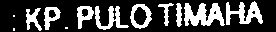

Predicted text for letter: hq



Predicted text for letter: P



Predicted text for letter: p



Predicted text for letter: vs



Predicted text for letter: O



Predicted text for letter: a7



Predicted text for letter: 


Predicted text for letter: ry



Predicted text for letter: hy



Predicted text for letter: ry



Predicted text for letter: a



Predicted text for letter: fut



Predicted text for letter: i



Predicted text for letter: ot



Predicted text for letter: ad



Predicted text for letter: iat



Predicted text for letter: Yo



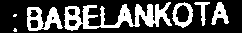

Predicted text for letter: .



Predicted text for letter: |



Predicted text for letter: [9]



Predicted text for letter: ae



Predicted text for letter: A



Predicted text for letter: K



Predicted text for letter: e



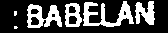

Predicted text for letter: o



Predicted text for letter: yy



Predicted text for letter: B



Predicted text for letter: ci0y



Predicted text for letter: I



Predicted text for letter: Eq



Predicted text for letter: a



Predicted text for letter: iF



Predicted text for letter: Es)



Predicted text for letter: I



Predicted text for letter: iS



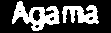

Predicted text for letter: ga



Predicted text for letter: a



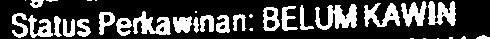

Predicted text for letter: Ss



Predicted text for letter: Ley



Predicted text for letter: 2



Predicted text for letter: i



Predicted text for letter: iT]



Predicted text for letter: Ey



Predicted text for letter: Pp



Predicted text for letter: e



Predicted text for letter: F



Predicted text for letter: w



Predicted text for letter: 4



Predicted text for letter: fn



Predicted text for letter: cI



Predicted text for letter: Fal



Predicted text for letter: 


Predicted text for letter: B



Predicted text for letter: ia



Predicted text for letter: a



Predicted text for letter: uty



Predicted text for letter: fy



Predicted text for letter: Yi



Predicted text for letter: 1



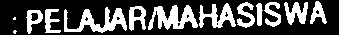

Predicted text for letter: P



Predicted text for letter: 3



Predicted text for letter: R



Predicted text for letter: HA



Predicted text for letter: ES



Predicted text for letter: i}



Predicted text for letter: Ss



Predicted text for letter: A



Predicted text for letter: A



Predicted text for letter: 8



Predicted text for letter: 3



Predicted text for letter: K



Predicted text for letter: ry



Predicted text for letter: s



Predicted text for letter: 


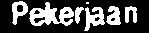

Predicted text for letter: .



Predicted text for letter: roc



Predicted text for letter: ¢



Predicted text for letter: a



Predicted text for letter: a



Predicted text for letter: iy



Predicted text for letter: i



Predicted text for letter: 1



Predicted text for letter: -



Predicted text for letter: 02



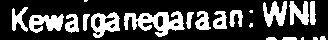

Predicted text for letter: K



Predicted text for letter: e



Predicted text for letter: 2



Predicted text for letter: Lf



Predicted text for letter: ee



Predicted text for letter: f



Predicted text for letter: a



Predicted text for letter: a



Predicted text for letter: f



Predicted text for letter: a



Predicted text for letter: i]



Predicted text for letter: N



Predicted text for letter: |



Predicted text for letter: a



Predicted text for letter: eS



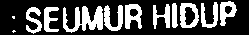

Predicted text for letter: s



Predicted text for letter: E



Predicted text for letter: UM



Predicted text for letter: u



Predicted text for letter: R



Predicted text for letter: H



Predicted text for letter: !



Predicted text for letter: D



Predicted text for letter: u



Predicted text for letter: p



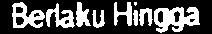

Predicted text for letter: iy



Predicted text for letter: da



Predicted text for letter: i



Predicted text for letter: U



Predicted text for letter: H



Predicted text for letter: 1



Predicted text for letter: ti)



Predicted text for letter: cer

Detected Word for Crop 1: P
=
O
i]
|
N
S
JA
Ww
A
B
A
R
ry
T

Detected Word for Crop 2: 4
.
B
U
P
A
a
=
i]
B
=
1
A
Ss
|

Detected Word for Crop 3: ce]
2
1
b
0
2
2
ri
ia
i)
0
e
1
0
0
5

Detected Word for Crop 4: |
a
14

Detected Word for Crop 5: a
.
Ww
a
D
ry
i]
chy
F
i
9}
Zz
MA
vy
a
U
is}
i}
N

Detected Word for Crop 6: ey
ma

Detected Word for Crop 7: i
Ly
Ss
i
3
i
vi
05
Ya
00
2

Detected Word for Crop 8: T
wt
Ci
F
h
f

Detected Word for Crop 9: G
ce)
.
D
a
t
3
Ly
'

Detected Word for Crop 10: vy
K
i
i,
L
i

Detected Word for Crop 11: e
ns

Detected Word for Crop 12: hq
P
p
vs
O
a7
ry
hy

Detected Word for Crop 13: ry
a
fut
i

Detected Word for Crop 14: 
Detected Word for Crop 15: ot
ad
iat
Yo

Detected Word for Crop 16: .
|
[9]
ae
A

Detected Word for Crop 17: K
e

Detected Word for Crop 18: o
yy
B
ci0y
I

Detected Wo

In [79]:
from PIL import Image, ImageOps
from google.colab.patches import cv2_imshow
import pytesseract as pts
import numpy as np

# List untuk menyimpan hasil crop
crop_results = []

# Variabel untuk menyimpan hasil deteksi karakter
detected_words = []

# Loop untuk menampilkan setiap hasil crop satu per satu
for ctr in sorted_contours_lines:
    x, y, w, h = cv2.boundingRect(ctr)

    # Periksa ukuran bounding box
    if (w >= 10 and w <= 1000) and (h >= 20 and h <= 50):
        # Crop bagian gambar yang ada di dalam bounding box
        cropped_img = crop[y:y+h, x:x+w]

        # Konversi ke citra greyscale
        gray_img = cv2.cvtColor(cropped_img, cv2.COLOR_BGR2GRAY)

        # Thresholding dengan Otsu
        _, otsu = cv2.threshold(gray_img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

        # Invertion
        invertion = 255 - otsu

        # Tambahkan hasil crop yang telah diproses ke dalam list
        crop_results.append(invertion)

        # Display crop_results
        cv2_imshow(invertion)

        # Segmentation of letters
        contours_letter, _ = cv2.findContours(invertion, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        contours_letter = sorted(contours_letter, key=lambda x: cv2.boundingRect(x)[0])

        # Array untuk menyimpan hasil prediksi huruf pada satu crop
        predicted_chars_crop = []

        # Segmentasi huruf berdasarkan bounding box dari tiap kontur
        for contour in contours_letter:
            x1, y1, w1, h1 = cv2.boundingRect(contour)

            # Tambahkan huruf ke list jika memenuhi kriteria tertentu (misal: min/max luas)
            if cv2.contourArea(contour) > 6 and w1/h1 < 2:
                letter = invertion[y1:y1+h1, x1:x1+w1]

                # Convert the image to PIL format
                pil_img = Image.fromarray(letter)

                # Tentukan ukuran padding (misalnya, 5 piksel)
                padding_size = 10

                # Buat border padding menggunakan ImageOps.expand
                padded_letter = ImageOps.expand(pil_img, border=padding_size, fill=(0,))

                # Konversi citra PIL ke array NumPy
                numpy_letter = np.array(padded_letter)

                # Resize pelebaran width
                desired_width = 30  # Sesuaikan dengan lebar yang diinginkan
                current_width = numpy_letter.shape[1]
                scale_factor = desired_width / current_width
                numpy_letter_resized = cv2.resize(numpy_letter, (desired_width, int(numpy_letter.shape[0] * scale_factor)))

                # Display the resized and padded segmented letter
                cv2_imshow(numpy_letter_resized)

                # Prediksi huruf
                predicted_char = pts.image_to_string(numpy_letter_resized, config='--psm 10')
                print(f"Predicted text for letter: {predicted_char}")

                # Tambahkan hasil prediksi ke dalam list
                predicted_chars_crop.append(predicted_char)

        # Gabungkan hasil prediksi huruf pada satu crop menjadi satu string
        detected_word = ''.join(predicted_chars_crop)
        detected_words.append(detected_word)

# Menampilkan hasil deteksi karakter untuk setiap crop
for i, detected_word in enumerate(detected_words):
    print(f"Detected Word for Crop {i + 1}: {detected_word}")

In [80]:
print(f"Detected Word for Crop 1: {detected_words[2]}")

Detected Word for Crop 1: ce]
2
1
b
0
2
2
ri
ia
i)
0
e
1
0
0
5

